# INTRODUCTION

##### As someone who has always been a "car guy", it would only have been fitting that my first ML project was something related to what I most love. Hence, I took it upon myself to look at a Car Prices dataset and predict prices of new cars from the perspective of a car enthusiast. I figured it would also be a good way to gain better understanding of the features and characteristics that most affect a car's prices. I must say though, the source of my motivation was to predict the price of the "2024 Dodge Charger Daytona SRT Concept" once deployed.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt             
%matplotlib inline     

In [2]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler 
from sklearn.model_selection import GridSearchCV, train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, accuracy_score, classification_report
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from category_encoders import TargetEncoder, OneHotEncoder
import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv("/Users/onkar/Downloads/car_prices_data.csv")
df.head(5)

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


In [4]:
df.shape   # since we only have about 12k rows, we will try to drop as few rows as possible

(11914, 16)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11914 entries, 0 to 11913
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Make               11914 non-null  object 
 1   Model              11914 non-null  object 
 2   Year               11914 non-null  int64  
 3   Engine Fuel Type   11911 non-null  object 
 4   Engine HP          11845 non-null  float64
 5   Engine Cylinders   11884 non-null  float64
 6   Transmission Type  11914 non-null  object 
 7   Driven_Wheels      11914 non-null  object 
 8   Number of Doors    11908 non-null  float64
 9   Market Category    8172 non-null   object 
 10  Vehicle Size       11914 non-null  object 
 11  Vehicle Style      11914 non-null  object 
 12  highway MPG        11914 non-null  int64  
 13  city mpg           11914 non-null  int64  
 14  Popularity         11914 non-null  int64  
 15  MSRP               11914 non-null  int64  
dtypes: float64(3), int64(5

### 1. DATA CLEANING

In [6]:
df.columns

Index(['Make', 'Model', 'Year', 'Engine Fuel Type', 'Engine HP',
       'Engine Cylinders', 'Transmission Type', 'Driven_Wheels',
       'Number of Doors', 'Market Category', 'Vehicle Size', 'Vehicle Style',
       'highway MPG', 'city mpg', 'Popularity', 'MSRP'],
      dtype='object')

In [7]:
df=df.drop(['Popularity'],axis=1)   # popularity column not relevant

In [8]:
df.isna().sum()

Make                    0
Model                   0
Year                    0
Engine Fuel Type        3
Engine HP              69
Engine Cylinders       30
Transmission Type       0
Driven_Wheels           0
Number of Doors         6
Market Category      3742
Vehicle Size            0
Vehicle Style           0
highway MPG             0
city mpg                0
MSRP                    0
dtype: int64

##### # Let's fix all missing values first

In [9]:
df=df.drop(['Market Category'],axis=1)
# Market Category is not an important segment & has large number of null values, hence can be dropped altogether

##### > Let's take a look at the engine cylinders as they have some NaNs

In [10]:
df[df['Engine Cylinders'].isna()]

# To see why no of cylinders are missing, and we see they are either Rotary engines (no cylinders) or EVs
# Mazda RX7s and RX8s have "Rotary" engines with power outputs similar to V6s, hence we will consider them as V6s

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Vehicle Size,Vehicle Style,highway MPG,city mpg,MSRP
1983,Chevrolet,Bolt EV,2017,electric,200.0,NaN,DIRECT_DRIVE,front wheel drive,4.0,Compact,4dr Hatchback,110,128,40905
1984,Chevrolet,Bolt EV,2017,electric,200.0,NaN,DIRECT_DRIVE,front wheel drive,4.0,Compact,4dr Hatchback,110,128,36620
3716,Volkswagen,e-Golf,2015,electric,115.0,NaN,DIRECT_DRIVE,front wheel drive,4.0,Compact,4dr Hatchback,105,126,33450
3717,Volkswagen,e-Golf,2015,electric,115.0,NaN,DIRECT_DRIVE,front wheel drive,4.0,Compact,4dr Hatchback,105,126,35445
3718,Volkswagen,e-Golf,2016,electric,115.0,NaN,DIRECT_DRIVE,front wheel drive,4.0,Compact,4dr Hatchback,105,126,28995
3719,Volkswagen,e-Golf,2016,electric,115.0,NaN,DIRECT_DRIVE,front wheel drive,4.0,Compact,4dr Hatchback,105,126,35595
5778,Mitsubishi,i-MiEV,2014,electric,NaN,NaN,DIRECT_DRIVE,rear wheel drive,4.0,Compact,4dr Hatchback,99,126,22995
5779,Mitsubishi,i-MiEV,2016,electric,66.0,NaN,DIRECT_DRIVE,rear wheel drive,4.0,Compact,4dr Hatchback,99,126,22995
5780,Mitsubishi,i-MiEV,2017,electric,66.0,NaN,DIRECT_DRIVE,rear wheel drive,4.0,Compact,4dr Hatchback,102,121,22995
8373,Toyota,RAV4 EV,2012,electric,154.0,NaN,DIRECT_DRIVE,front wheel drive,4.0,Midsize,4dr SUV,74,78,49800


In [11]:
# if Make is Mazda and Engine Cylinders is NaN, Engine Cylinders = 6.0 :

df['Engine Cylinders'] = np.where(( df['Make'] == 'Mazda') & (df['Engine Cylinders'].isna()),
                                                                6.0, df['Engine Cylinders'])

# if Make is not Mazda and Engine Cylinders is NaN, Engine Cylinders = 0.0 (EVs):

df['Engine Cylinders'] = np.where(( df['Make'] != 'Mazda') & (df['Engine Cylinders'].isna()),
                                                                0.0, df['Engine Cylinders'])

df[df['Engine Cylinders'].isna()].sum()

Make                 0.0
Model                0.0
Year                 0.0
Engine Fuel Type     0.0
Engine HP            0.0
Engine Cylinders     0.0
Transmission Type    0.0
Driven_Wheels        0.0
Number of Doors      0.0
Vehicle Size         0.0
Vehicle Style        0.0
highway MPG          0.0
city mpg             0.0
MSRP                 0.0
dtype: float64

In [12]:
df[df['Engine Cylinders']==16]   # these can be dropped as they are very expensive and can be considered outliers

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Vehicle Size,Vehicle Style,highway MPG,city mpg,MSRP
11362,Bugatti,Veyron 16.4,2008,premium unleaded (required),1001.0,16.0,AUTOMATED_MANUAL,all wheel drive,2.0,Compact,Coupe,14,8,2065902
11363,Bugatti,Veyron 16.4,2008,premium unleaded (required),1001.0,16.0,AUTOMATED_MANUAL,all wheel drive,2.0,Compact,Coupe,14,8,1500000
11364,Bugatti,Veyron 16.4,2009,premium unleaded (required),1001.0,16.0,AUTOMATED_MANUAL,all wheel drive,2.0,Compact,Coupe,14,8,1705769


In [13]:
# Drop 3 and 16 cylinder engines and inspect why we have 0 cylinder engines (they are EVs)

df=df[ df['Engine Cylinders']!=3 ]
df=df[ df['Engine Cylinders']!=16 ]

df['Engine Cylinders'].value_counts()

4.0     4752
6.0     4509
8.0     2031
12.0     230
5.0      225
10.0      68
0.0       66
Name: Engine Cylinders, dtype: int64

In [14]:
df[df['Engine Cylinders']==0]['Engine Fuel Type'].unique()   # as suspected, all cars with 0 cylinders are EVs

array(['electric'], dtype=object)

#### > Let's also take a look at engine HP as they have some NaNs too

##### # Reduce categories of fuel type first to get better detailed understanding:

In [15]:
df['Engine Fuel Type'].value_counts()

regular unleaded                                7142
premium unleaded (required)                     2006
premium unleaded (recommended)                  1523
flex-fuel (unleaded/E85)                         899
diesel                                           154
electric                                          66
flex-fuel (premium unleaded required/E85)         54
flex-fuel (premium unleaded recommended/E85)      26
flex-fuel (unleaded/natural gas)                   6
natural gas                                        2
Name: Engine Fuel Type, dtype: int64

In [16]:
df['Engine Fuel Type'].where(~(df["Engine Fuel Type"]=='regular unleaded'), other='O87', inplace=True)    
# unleaded fuel replaced as 87 Octane

df['Engine Fuel Type'].where(~(df["Engine Fuel Type"]=='premium unleaded (required)'), other='O89', inplace=True)   
df['Engine Fuel Type'].where(~(df["Engine Fuel Type"]=='premium unleaded (recommended)'), other='O89', inplace=True)   
# premium unleaded fuel replaced as 89 Octane

df['Engine Fuel Type'].where(~(df["Engine Fuel Type"]=='flex-fuel (unleaded/E85)'), other='E85', inplace=True)    
df['Engine Fuel Type'].where(~(df["Engine Fuel Type"]=='flex-fuel (premium unleaded required/E85)'), other='E85', inplace=True)    
df['Engine Fuel Type'].where(~(df["Engine Fuel Type"]=='flex-fuel (premium unleaded recommended/E85)'), other='E85', inplace=True)    
df['Engine Fuel Type'].where(~(df["Engine Fuel Type"]=='flex-fuel (unleaded/natural gas)'), other='E85', inplace=True)    
# flex fuel replaced as E85 (85% ethanol)

df['Engine Fuel Type'].where(~(df["Engine Fuel Type"]=='diesel'), other='DZ', inplace=True)
df['Engine Fuel Type'].where(~(df["Engine Fuel Type"]=='electric'), other='EV', inplace=True)
# renamed disel and electric as DZ and EV respectively

df = df[ df['Engine Fuel Type'] != 'natural gas']
# drop rows having fuel as CNG as there's only 2 of them

df=df.dropna(subset=['Engine Fuel Type'])
# drop rows not having fuel type as there's only 3 of them

df['Engine Fuel Type'].unique()
# we can see that we only have our 5 categories now as opposed to the almost dozen previously

array(['O89', 'O87', 'E85', 'DZ', 'EV'], dtype=object)

##### # Now we can check whether all missing HPs are EVs or otherwise 

In [17]:
df[df['Engine HP'].isna()]['Engine Fuel Type'].value_counts()   # Not all of them are EVs, which is surprising

EV     44
O87    14
E85     6
O89     4
DZ      1
Name: Engine Fuel Type, dtype: int64

In [18]:
# We will find out what the average HPs of all these vehicles are and then replace the NaNs with them

ev_hp=round(df[df['Engine Fuel Type'] == 'EV']['Engine HP'].mean())
print("Mean EV HP:",ev_hp)

dz_hp=round(df[df['Engine Fuel Type'] == 'DZ']['Engine HP'].mean())
print("Mean DZ HP:",dz_hp)

e85_hp=round(df[df['Engine Fuel Type'] == 'E85']['Engine HP'].mean())
print("Mean E85 HP:",e85_hp)

o87_hp=round(df[df['Engine Fuel Type'] == 'O87']['Engine HP'].mean())
print("Mean O87 HP:",o87_hp)

o89_hp=round(df[df['Engine Fuel Type'] == 'O89']['Engine HP'].mean())
print("Mean O89 HP:",o89_hp)

Mean EV HP: 145
Mean DZ HP: 184
Mean E85 HP: 298
Mean O87 HP: 206
Mean O89 HP: 329


In [19]:
# Now we replace missing HPs with the respective average HPs for their fuel type

df[df['Engine Fuel Type'] == 'EV'] = df[df['Engine Fuel Type'] == 'EV'].fillna(ev_hp)
df[df['Engine Fuel Type'] == 'DZ'] = df[df['Engine Fuel Type'] == 'DZ'].fillna(dz_hp)
df[df['Engine Fuel Type'] == 'E85'] = df[df['Engine Fuel Type'] == 'E85'].fillna(e85_hp)
df[df['Engine Fuel Type'] == 'O87'] = df[df['Engine Fuel Type'] == 'O87'].fillna(o87_hp)
df[df['Engine Fuel Type'] == 'O89'] = df[df['Engine Fuel Type'] == 'O89'].fillna(o89_hp)

df[df['Engine HP'].isna()]['Engine Fuel Type'].sum()

# you can check whether the mean has been maintained by re-running the upper snippet of code under this snippet

0

##### # We have now fixed all null values, so we now simplify our data for better data analysis

In [20]:
# Convert all float columns to integers where possible i.e. if they have no NaNs

df['Engine HP']=df['Engine HP'].astype(int)
df['Engine Cylinders']=df['Engine Cylinders'].astype(int)
df['Number of Doors']=df['Number of Doors'].astype(int)

df.dtypes

Make                 object
Model                object
Year                  int64
Engine Fuel Type     object
Engine HP             int64
Engine Cylinders      int64
Transmission Type    object
Driven_Wheels        object
Number of Doors       int64
Vehicle Size         object
Vehicle Style        object
highway MPG           int64
city mpg              int64
MSRP                  int64
dtype: object

In [21]:
df.rename(columns = {'Engine Fuel Type' : 'Fuel', 'Engine HP' : 'HP','Engine Cylinders' : 'Cylinders', 
                        'Transmission Type' : 'Transmission', 'Driven_Wheels' : 'Drive', 'MSRP' : 'Price',
                        'Number of Doors' : 'Doors', 'Vehicle Size' : 'Size', 'Vehicle Style' : 'Style',
                        'highway MPG' : 'Highway MPG', 'city mpg' : 'City MPG'}, inplace = True)

df.columns

Index(['Make', 'Model', 'Year', 'Fuel', 'HP', 'Cylinders', 'Transmission',
       'Drive', 'Doors', 'Size', 'Style', 'Highway MPG', 'City MPG', 'Price'],
      dtype='object')

##### > Let's change the wheel drive variable to accepted format of RWD, FWD, AWD & 4WD

In [22]:
df['Drive'].unique()

array(['rear wheel drive', 'front wheel drive', 'all wheel drive',
       'four wheel drive'], dtype=object)

In [23]:
df['Drive'].where(~(df['Drive']=='rear wheel drive'), other='RWD', inplace=True)    
df['Drive'].where(~(df['Drive']=='front wheel drive'), other='FWD', inplace=True)    
df['Drive'].where(~(df['Drive']=='all wheel drive'), other='AWD', inplace=True)    
df['Drive'].where(~(df['Drive']=='four wheel drive'), other='4WD', inplace=True)    

df['Drive'].unique()

array(['RWD', 'FWD', 'AWD', '4WD'], dtype=object)

##### > Check if transmission, doors, size & style require changes

In [24]:
df['Size'].unique()   # no change required here

array(['Compact', 'Midsize', 'Large'], dtype=object)

In [25]:
df['Style'].unique()   # no change required here

array(['Coupe', 'Convertible', 'Sedan', 'Wagon', '4dr Hatchback',
       '2dr Hatchback', '4dr SUV', 'Passenger Minivan', 'Cargo Minivan',
       'Crew Cab Pickup', 'Regular Cab Pickup', 'Extended Cab Pickup',
       '2dr SUV', 'Cargo Van', 'Convertible SUV', 'Passenger Van'],
      dtype=object)

In [26]:
# DOORS

df['Doors'].value_counts()

4      8326
2      3149
3       395
145       5
329       1
Name: Doors, dtype: int64

In [27]:
df=df[ df['Doors']<=4 ]   # anything more than 4 doors are obviously errors & have low numbers, hence dropped
df['Doors'].where(~(df['Doors']==3), other=2, inplace=True)    # 2 door coupes often considered as 3 door

df['Doors'].value_counts()

4    8326
2    3544
Name: Doors, dtype: int64

In [28]:
# TRANSMISSION

df['Transmission'].value_counts()

AUTOMATIC           8249
MANUAL              2917
AUTOMATED_MANUAL     622
DIRECT_DRIVE          63
UNKNOWN               19
Name: Transmission, dtype: int64

In [29]:
df=df[df['Transmission']!='UNKNOWN']   # drop unknown transmissions, change all the rest
df['Transmission'].where(~(df['Transmission']=='AUTOMATIC'), other='AT', inplace=True)
df['Transmission'].where(~(df['Transmission']=='MANUAL'), other='MT', inplace=True)
df['Transmission'].where(~(df['Transmission']=='AUTOMATED_MANUAL'), other='AMT', inplace=True)
df['Transmission'].where(~(df['Transmission']=='DIRECT_DRIVE'), other='DDT', inplace=True)

df['Transmission'].value_counts()

AT     8249
MT     2917
AMT     622
DDT      63
Name: Transmission, dtype: int64

##### > Finally, let's check for duplicate entries and drop them

In [30]:
print('Number of duplicates removed : ', df.duplicated().sum())
df = df.drop_duplicates()

Number of duplicates removed :  713


### 2. Exploratory Data Analysis

##### # Now that we have cleaned our data, let's look at our data in an organized way instead of looking at data that would've been visualized haphazardly and would've been difficult to make sense of

In [31]:
for i in df:
    fig = px.histogram(df, x=i, color_discrete_sequence=px.colors.qualitative.Antique, text_auto=True)
    fig.show()

##### > Now let's map the relationship between price and other variables

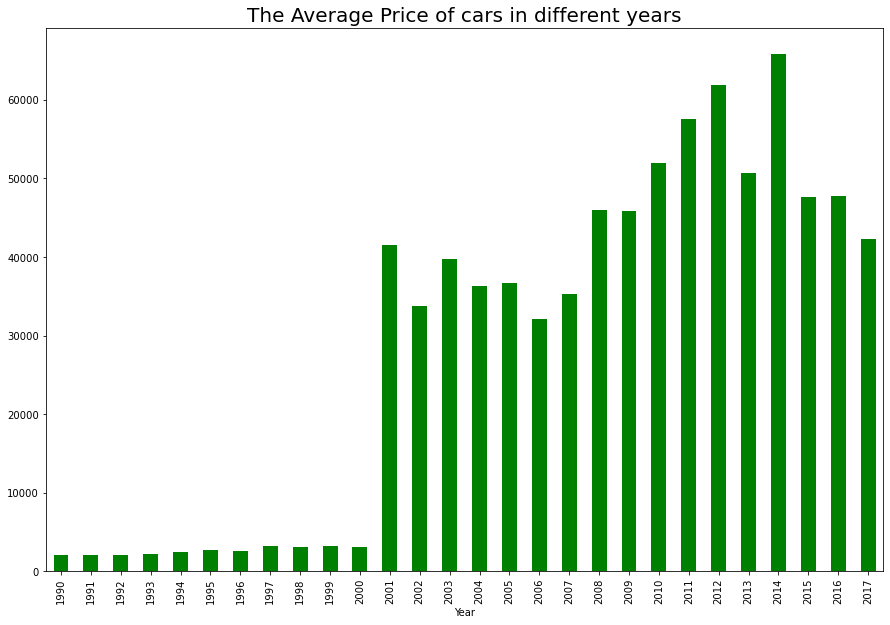

In [32]:
plt.figure(figsize = (15, 10))
df.groupby('Year')['Price'].mean().plot(kind = 'bar', color = 'g')
plt.title("The Average Price of cars in different years", fontsize = 20)
plt.show()

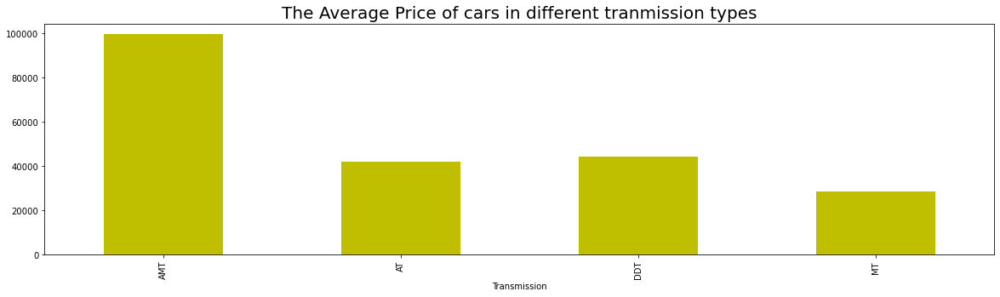

In [33]:
plt.figure(figsize = (20, 5))
df.groupby('Transmission')['Price'].mean().plot(kind = 'bar', color = 'y')
plt.title("The Average Price of cars in different tranmission types", fontsize = 20)
plt.show()

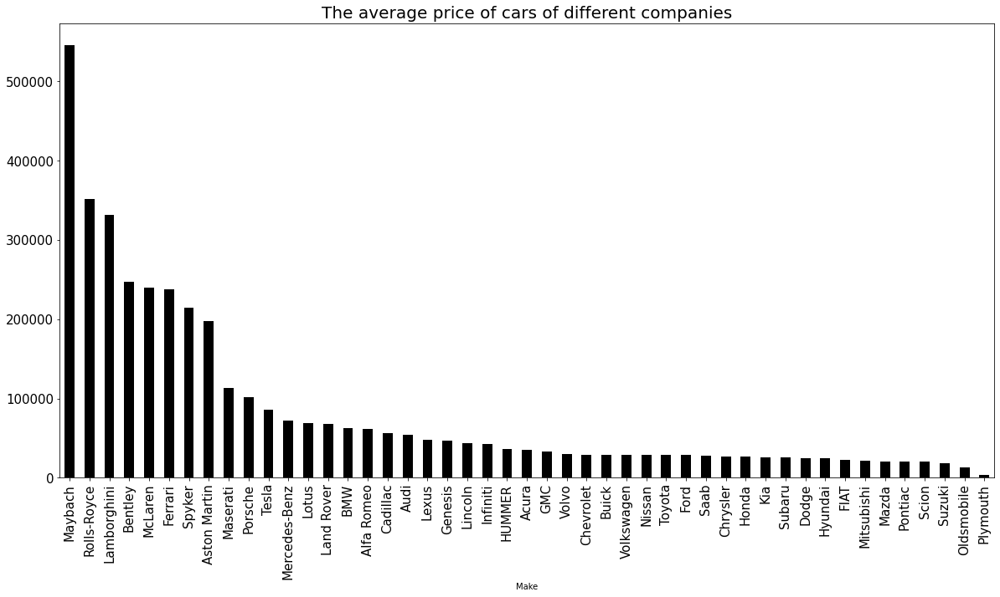

In [34]:
plt.figure(figsize = (20, 10))
df.groupby(['Make']).mean()['Price'].sort_values(ascending = False).plot(kind = 'bar', fontsize = 15, color = 'black')
plt.title("The average price of cars of different companies", fontsize = 20)
plt.show()

##### # Relationship between Price and Year

In [35]:
fig = px.scatter(df, x = 'Year', y = 'Price', color = 'Cylinders')
fig.show()

##### INSIGHTS -

1. The number of cylinders used in cars have significantly increased from year 2001.
2. In year 2015-2017, we observe that most of the cars are running 4 cylinders engines. 
3. Car prices have increased rapidly since the beginning 2001 & have kept increasing since.

##### # Relationship between Price and HP

In [36]:
fig = px.scatter(df, x = 'HP', y = 'Price', color = 'Cylinders')
fig.show()

##### INSIGHTS -

1. There is clearly a positive relation between HP and price.
2. As the HP>270, most cars are likely to have 8 cylinders.
3. Cars having HP<180 are more likely to have 4 cylinders.

##### # Relationship between Price and Cylinders

In [37]:
fig = px.scatter(df, x = 'Cylinders', y = 'Price', color = 'Cylinders')
fig.show()

##### INSIGHTS -

1. More cylinders ideally produce more HPs, hence they are costlier.
2. Some 4-8 & 12 cylinder vehicles can be bought between 2k-10k.
3. All 8 cylinder vehicles can cost anywhere between 2k-300k.

##### # Relationship between Price and Doors

In [38]:
fig = px.scatter(df, x = 'Doors', y = 'Price', color = 'Cylinders')
fig.show()

##### INSIGHTS -

1. Most of the cars having 2 doors under 50k are more likely to have 4 cylinders.
2. Most of the cars having 4 doors and price between 50k-150k are more likely to have 8 cylinders.

##### # Relationship between Price and City MPG

In [39]:
fig = px.scatter(df, x = 'City MPG', y = 'Price', color = 'Cylinders')
fig.show()

##### INSIGHTS -

1. Most vehicles giving 16mpg in the city and lower are likely to have 8 cylinders.
2. Most vehicles giving 20-31 mpg in the city are likely to have 4 cylinders & cost under 50k.
3. Almost all vehicles that give more than 30m-58pg in the city are 4 cylinders and cost less than 50k.
4. All vehicles with a City MPG of 78 or over are EVs.

##### # Relationship between Price and Highway MPG

In [40]:
fig = px.scatter(df, x = 'Highway MPG', y = 'Price', color = 'Cylinders')
fig.show()

##### INSIGHTS -

1. Most cars averaging 18mpg and under on the highway are likely to have 8 cylinders.
2. Most cars averaging 19-27mpg on the highway are likely to have 6 cylinders.
3. Most cars averaging 27-53 mpg on the highway are likely to have 4 cylinders.
4. All vehicles with a Highway MPG of 74 or over are EVs.

<AxesSubplot:>

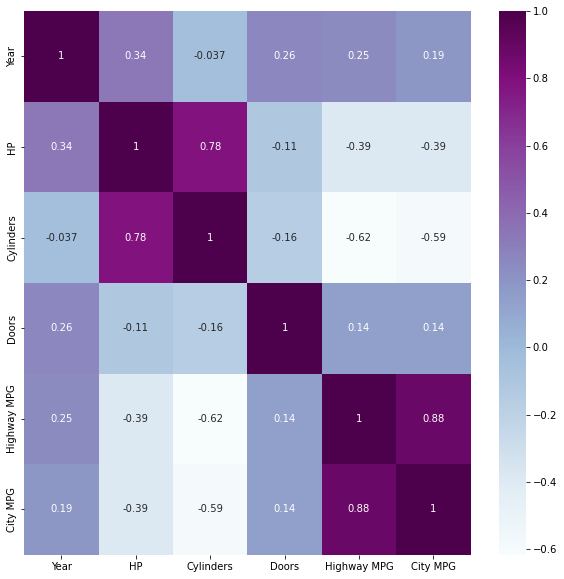

In [41]:
plt.figure(figsize = (10, 10))
numeric_columns = ['Year','HP','Cylinders','Doors','Highway MPG','City MPG',]
heatmap_data = df[numeric_columns].corr()

sns.heatmap(heatmap_data, cmap = 'BuPu', annot = True)

##### INSIGHTS -

We see that ‘City MPG’ and ‘Highway MPG’ are quite correlated to each other with a correlation coefficient being equal to 0.92 Similarly, the features ‘Cylinders’ and ‘HP’ are also related. The remaining features seem to be related in a negative way or uncorrelated.

### 3. Extreme outlier removal

##### # From the EDA, we have seen that outliers exist only in Highway MPG, City MPG, and Price

In [42]:
print(df['Highway MPG'].describe())
print('\n')
print(df['City MPG'].describe())
print('\n')
print(df['Price'].describe())

count    11138.000000
mean        26.550368
std          8.819309
min         12.000000
25%         22.000000
50%         25.000000
75%         30.000000
max        354.000000
Name: Highway MPG, dtype: float64


count    11138.000000
mean        19.671305
std          9.021487
min          7.000000
25%         16.000000
50%         18.000000
75%         22.000000
max        137.000000
Name: City MPG, dtype: float64


count    1.113800e+04
mean     4.156602e+04
std      5.466397e+04
min      2.000000e+03
25%      2.169600e+04
50%      3.076000e+04
75%      4.310000e+04
max      1.500000e+06
Name: Price, dtype: float64


In [43]:
df[df['Highway MPG']>45]['Highway MPG'].value_counts()   # we have chosen 45 as that's 1.5 times the 75th quartile

# Highway MPG values over 53mpg are very low (excluding 101/105/109 mpg), hence they can be dropped

46     21
48     16
50     10
101    10
47      7
105     6
109     6
53      5
99      5
92      5
90      4
102     3
111     3
82      3
74      3
110     2
106     2
103     2
97      2
354     1
94      1
100     1
107     1
98      1
108     1
Name: Highway MPG, dtype: int64

In [44]:
df[df['City MPG']>33]['City MPG'].value_counts()   # we have chosen 33 as that's 1.5 times the 75th quartile

# City MPG values over 54mpg are very low (excluding 128), hence they can be dropped

41     21
36     20
40     19
44     18
42     17
34     15
126    14
43     13
53     13
35     13
54     10
128     8
51      6
39      6
50      6
120     5
49      4
88      4
78      3
101     3
55      3
121     3
137     3
110     3
85      3
124     2
94      2
58      2
47      2
132     2
38      1
122     1
91      1
89      1
95      1
86      1
129     1
Name: City MPG, dtype: int64

In [45]:
df[df['Price']>300000]['Price'].count()   # we have chosen 300k looking at the EDA histogram

92

##### # Now that we've determined the boundary for our outliers, let's remove the extreme outliers

In [46]:
df = df[df['Highway MPG'] <= 53]
df = df[df['City MPG'] <= 54]
df = df[df['Price'] <= 300000]

print("Max Highway MPG:",df['Highway MPG'].max())
print("Max City MPG:",df['City MPG'].max())
print("Max Price:",df['Price'].max())

Max Highway MPG: 50
Max City MPG: 54
Max Price: 299900


Highway MPG being lower than City MPG may seem wrong, but this is what the data suggest. This makes sense as accelarating harder in an EV can cause it to lose charge quicker. Run the following code to check:
df[df['City MPG']>50]

### 4. Data Visualization

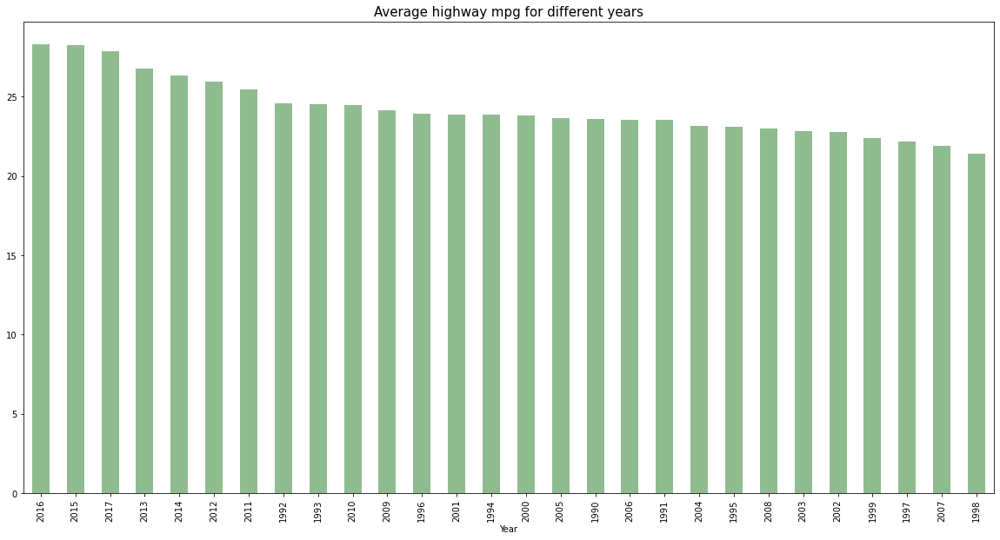

In [47]:
plt.figure(figsize = (20,10))
df.groupby('Year').mean()['Highway MPG'].sort_values(ascending = False).plot(kind='bar', color='darkseagreen')
plt.title("Average highway mpg for different years", fontsize = 15)
plt.show()

<AxesSubplot:ylabel='Make'>

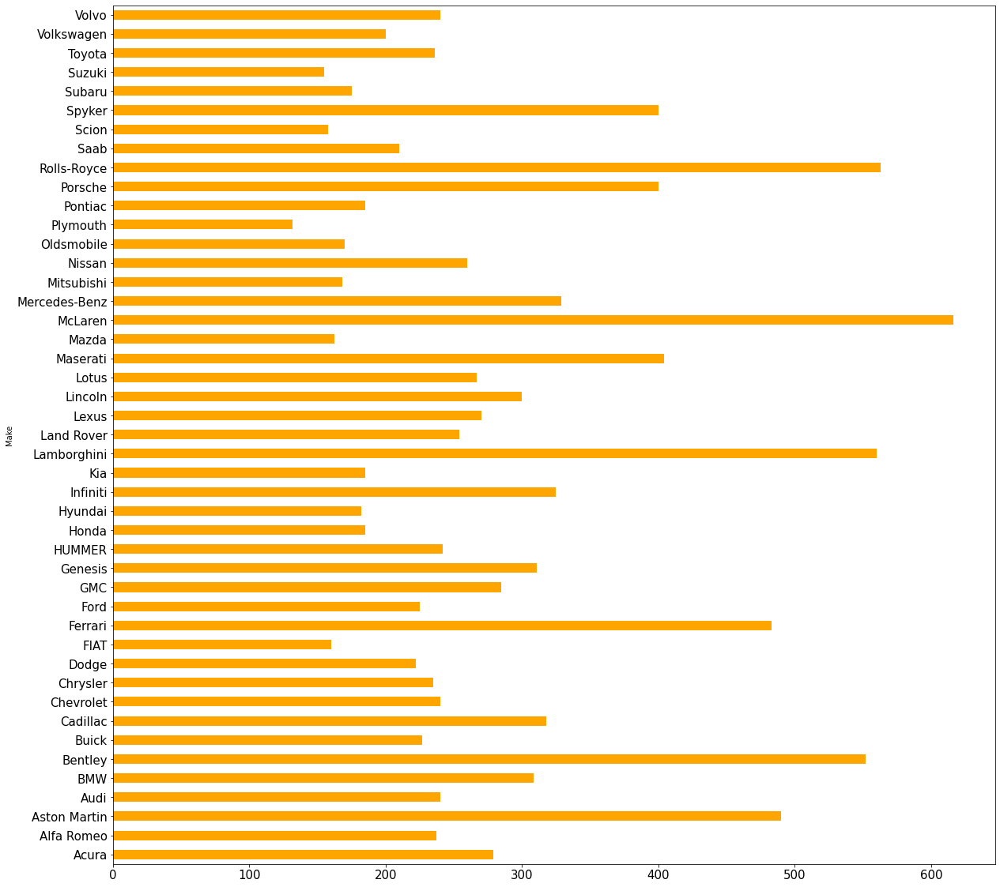

In [48]:
plt.figure(figsize = (20,20))
df.groupby('Make').median()['HP'].plot(kind='barh', fontsize=15, color='orange')

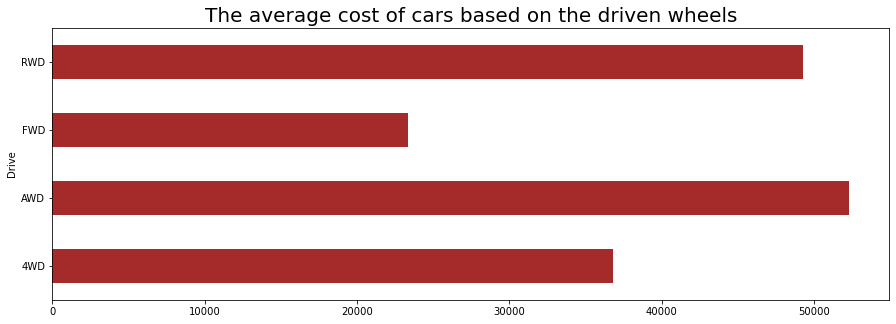

In [49]:
plt.figure(figsize = (15,5))
df.groupby('Drive').mean()['Price'].plot(kind = 'barh', color = 'brown')
plt.title("The average cost of cars based on the driven wheels", fontsize= 20)
plt.show()

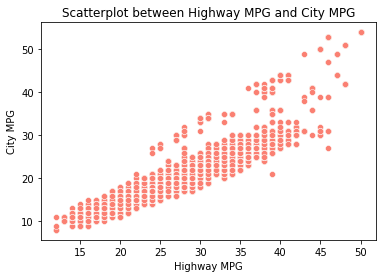

In [50]:
sns.scatterplot(x = 'Highway MPG', y ='City MPG', data = df, color = 'salmon')
plt.title("Scatterplot between Highway MPG and City MPG")
plt.show()

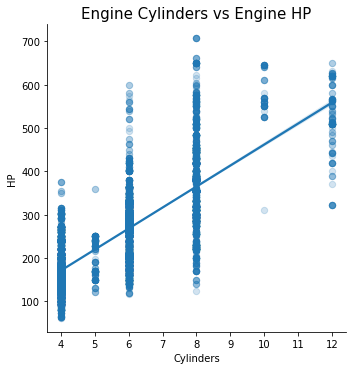

In [51]:
sns.lmplot(x = 'Cylinders', y = 'HP', scatter_kws = {"s": 40, "alpha": 0.2}, data = df)
plt.title("Engine Cylinders vs Engine HP", fontsize = 15)
plt.show()

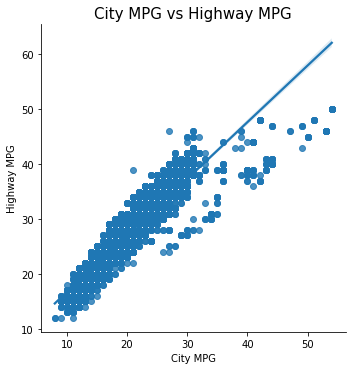

In [52]:
sns.lmplot(x = 'City MPG', y = 'Highway MPG', data = df)
plt.title("City MPG vs Highway MPG", fontsize = 15)
plt.show()

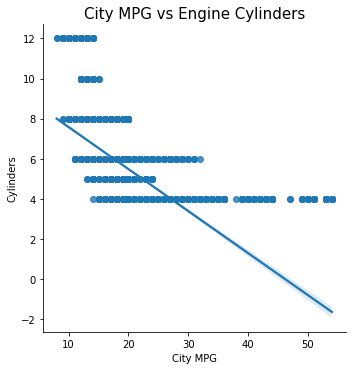

In [53]:
sns.lmplot(x = 'City MPG', y = 'Cylinders', data = df)
plt.title("City MPG vs Engine Cylinders", fontsize = 15)
plt.show()

### 5. Data Preprocessing

##### > Feature Engineering

In [54]:
df['Year'].max()

2017

In [55]:
df['Latest Year'] = 2018
df['Years Manufactured'] = df['Latest Year'] - df['Year']
df.drop(['Latest Year'], inplace = True, axis = 1)

If the car is manufactured for a long time, the price should be influenced by this feature. We chose 2018 as the latest year as we want to have at least 1 year of manufacture.

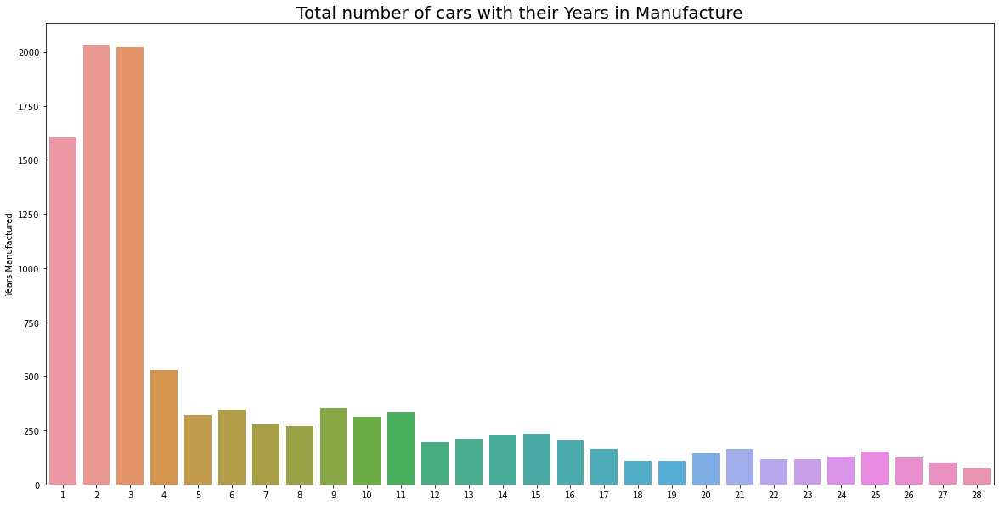

In [56]:
plt.figure(figsize = (20, 10))
sns.barplot(y = df['Years Manufactured'].value_counts(), x = df['Years Manufactured'].value_counts().index)
plt.title("Total number of cars with their Years in Manufacture", fontsize = 20)
plt.show()

##### > Train-Test Split

In [57]:
y = df.Price
X = df.drop(['Price'], axis=1)

In [58]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100)

##### > Encoding

In [59]:
encoder = TargetEncoder(cols=['Make','Model','Fuel', 'Transmission', 'Drive', 'Size', 'Style'])
encoder.fit(X_train, y_train.to_frame()['Price'])

X_train = encoder.transform(X_train)
X_test = encoder.transform(X_test)

# Encoding is used to convert categorical features to numerical features

##### > Scaling

In [60]:
scaler = MinMaxScaler()
scaler.fit(X_train)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

### 6. Model Building

In [61]:
error_mean_square = []
error_mean_absolute = []

# We create an empty list and will append the values later so we can analyze different ML algorithms to deploy

##### > Linear Regression model

In [62]:
model = LinearRegression()
model.fit(X_train, y_train)
y_predict = model.predict(X_test).round().astype('int')

error_mean_square.append(int(mean_squared_error(y_predict, y_test)))
error_mean_absolute.append(int(mean_absolute_error(y_predict, y_test)))

print("The mean absolute error is : $",error_mean_absolute[0])

The mean absolute error is : $ 5993


In [63]:
y_predict = pd.DataFrame(y_predict, columns = ['Predicted Price'])
results = pd.concat([y_predict, y_test.to_frame().reset_index(drop = True)], axis = 1, ignore_index = False)
results.head()

,Predicted Price,Price
0,37952,32530
1,119328,98500
2,38496,38600
3,73952,228080
4,15968,21985


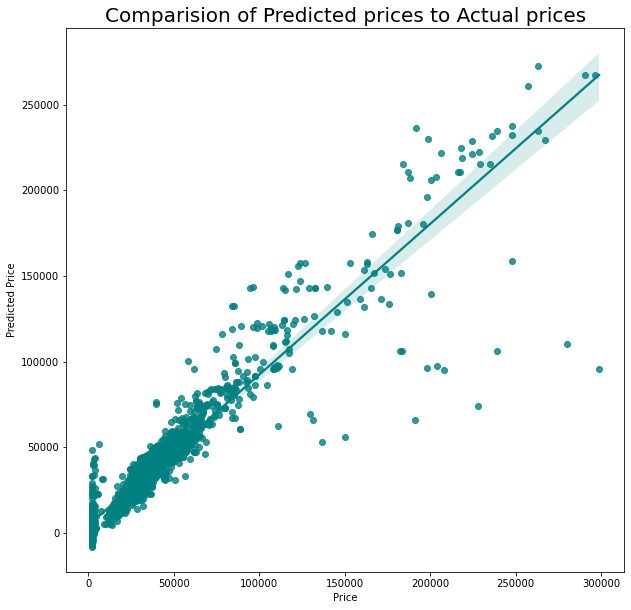

In [64]:
plt.figure(figsize = (10, 10))
sns.regplot(data = results, y = 'Predicted Price', x = 'Price', color = 'teal', marker = 'o')
plt.title("Comparision of Predicted prices to Actual prices", fontsize = 20)
plt.show()

##### > Support Vector Regressor

In [65]:
model = SVR()
model.fit(X_train, y_train)

y_predict = model.predict(X_test).round().astype('int')
y_predict = pd.DataFrame(y_predict, columns = ['Predicted Price'])

results = pd.concat([y_predict, y_test.to_frame().reset_index(drop = True)], axis = 1, ignore_index = False)

In [66]:
error_mean_square.append(int(mean_squared_error(y_predict, y_test)))
error_mean_absolute.append(int(mean_absolute_error(y_predict, y_test)))

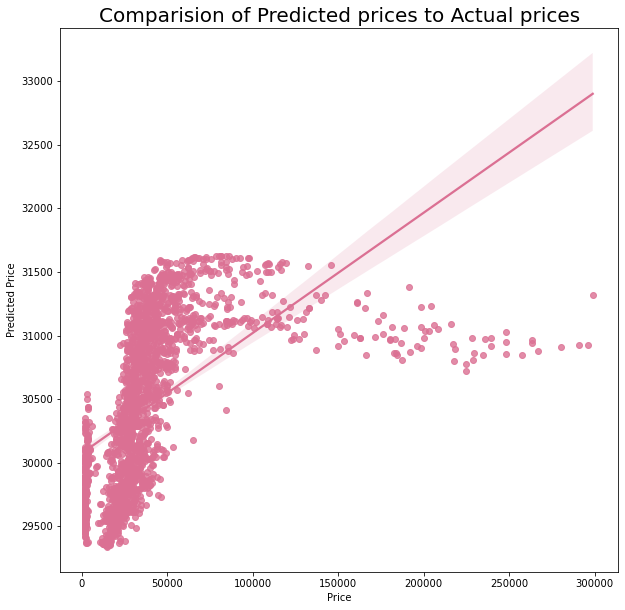

In [67]:
plt.figure(figsize = (10, 10))
sns.regplot(data = results, y = 'Predicted Price', x = 'Price', color = 'palevioletred', marker = 'o')
plt.title("Comparision of Predicted prices to Actual prices", fontsize = 20)
plt.show()

##### > K-Neighbors Regressor

In [68]:
model = KNeighborsRegressor(n_neighbors = 2)
model.fit(X_train, y_train)

y_predict = model.predict(X_test).round().astype('int')
y_predict = pd.DataFrame(y_predict, columns = ['Predicted Price'])

results = pd.concat([y_predict, y_test.to_frame().reset_index(drop = True)], axis = 1, ignore_index = False)

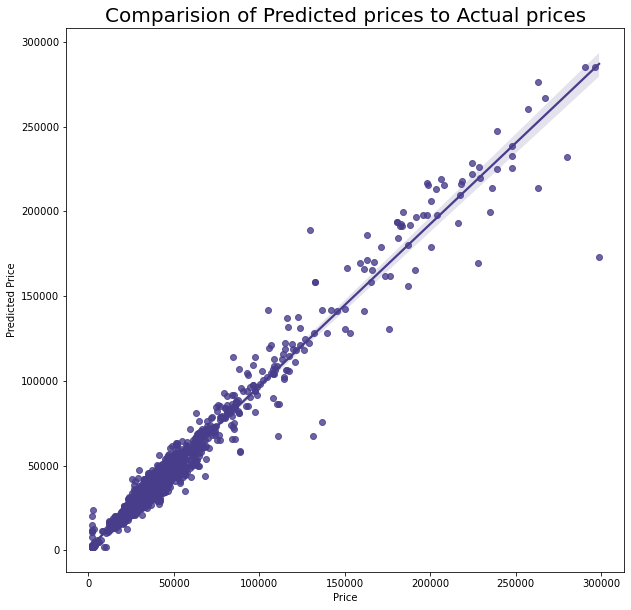

In [69]:
plt.figure(figsize = (10, 10))
sns.regplot(data = results, y = 'Predicted Price', x = 'Price', color = 'darkslateblue', marker = 'o')
plt.title("Comparision of Predicted prices to Actual prices", fontsize = 20)
plt.show()

In [70]:
error_mean_square.append(int(mean_squared_error(y_predict, y_test)))
error_mean_absolute.append(int(mean_absolute_error(y_predict, y_test)))

##### > Decision Tree Regressor

In [71]:
model = DecisionTreeRegressor(splitter = 'random')
model.fit(X_train, y_train)

y_predict = model.predict(X_test).round().astype('int')
y_predict = pd.DataFrame(y_predict, columns = ['Predicted Price'])

results = pd.concat([y_predict, y_test.to_frame().reset_index(drop = True)], axis = 1, ignore_index = False)

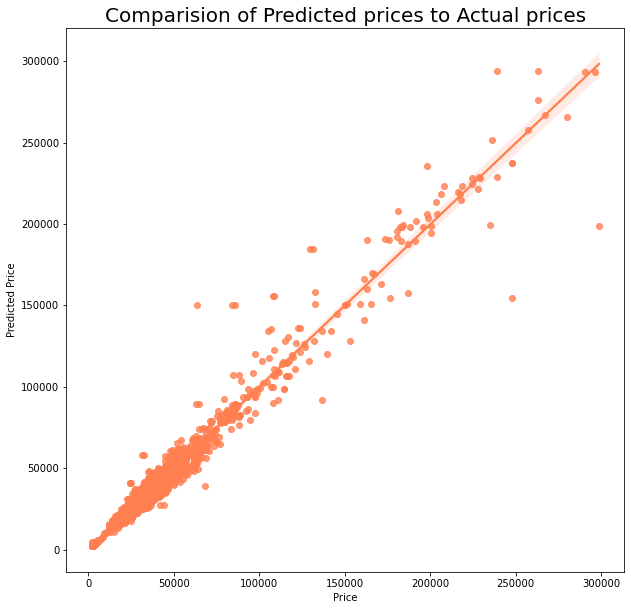

In [72]:
plt.figure(figsize = (10, 10))
sns.regplot(data = results, y = 'Predicted Price', x = 'Price', color = 'coral', marker = 'o')
plt.title("Comparision of Predicted prices to Actual prices", fontsize = 20)
plt.show()

In [73]:
error_mean_square.append(int(mean_squared_error(y_predict, y_test)))
error_mean_absolute.append(int(mean_absolute_error(y_predict, y_test)))

##### > Random Trees Regressor

In [74]:
model = RandomForestRegressor(random_state=0, max_depth=5)
model.fit(X_train, y_train)

y_predict = model.predict(X_test).round().astype('int')
y_predict = pd.DataFrame(y_predict, columns = ['Predicted Price'])

results = pd.concat([y_predict, y_test.to_frame().reset_index(drop = True)], axis = 1, ignore_index = False)

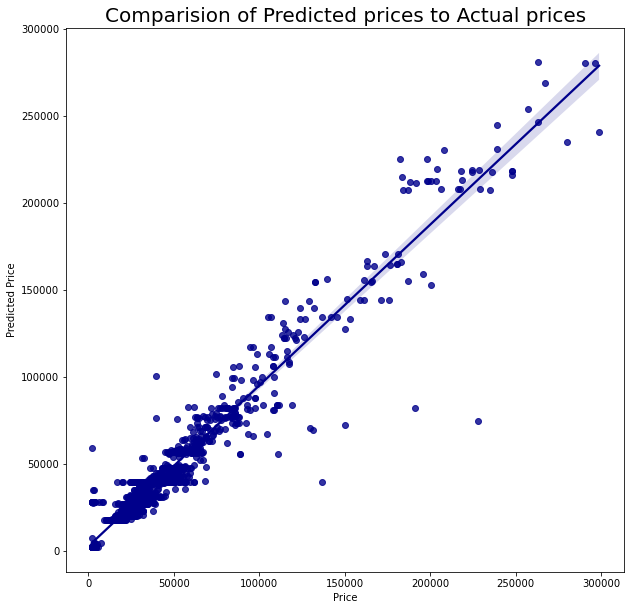

In [75]:
plt.figure(figsize = (10, 10))
sns.regplot(data = results, y = 'Predicted Price', x = 'Price', color = 'darkblue', marker = 'o')
plt.title("Comparision of Predicted prices to Actual prices", fontsize = 20)
plt.show()

In [76]:
error_mean_square.append(int(mean_squared_error(y_predict, y_test)))
error_mean_absolute.append(int(mean_absolute_error(y_predict, y_test)))

##### > Gradient Boosting Regressor

In [77]:
model = GradientBoostingRegressor()
model.fit(X_train, y_train)

y_predict = model.predict(X_test).round().astype('int')
y_predict = pd.DataFrame(y_predict, columns = ['Predicted Price'])

results = pd.concat([y_predict, y_test.to_frame().reset_index(drop = True)], axis = 1, ignore_index = False)

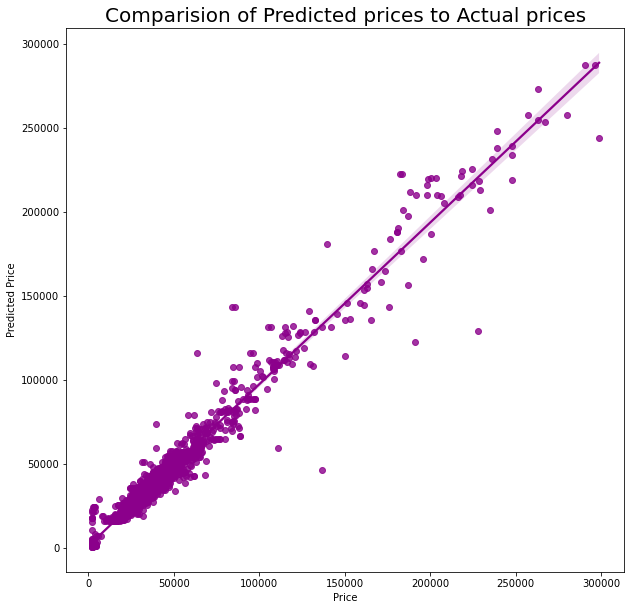

In [78]:
plt.figure(figsize = (10, 10))
sns.regplot(data = results, y = 'Predicted Price', x = 'Price', color = 'darkmagenta', marker = 'o')
plt.title("Comparision of Predicted prices to Actual prices", fontsize = 20)
plt.show()

In [79]:
error_mean_square.append(int(mean_squared_error(y_predict, y_test)))
error_mean_absolute.append(int(mean_absolute_error(y_predict, y_test)))

##### > Comparing Models

In [80]:
data = {'Models': ['Linear Regression', 'Support Vector Regressor', 'K-Nearest Regressor', 
                   'Decision Tree Regressor', 'Random Forest Regressor', 'Gradient Boosting Regressor'], 
        'Mean Absolute Error': error_mean_absolute, 'Mean Squared Error': error_mean_square}

model_dataframe = pd.DataFrame(data)
model_dataframe

,Models,Mean Absolute Error,Mean Squared Error
0,Linear Regression,5993,159374958
1,Support Vector Regressor,19826,1405112289
2,K-Nearest Regressor,3431,43302991
3,Decision Tree Regressor,3230,45396715
4,Random Forest Regressor,4697,81111481
5,Gradient Boosting Regressor,3740,47869992


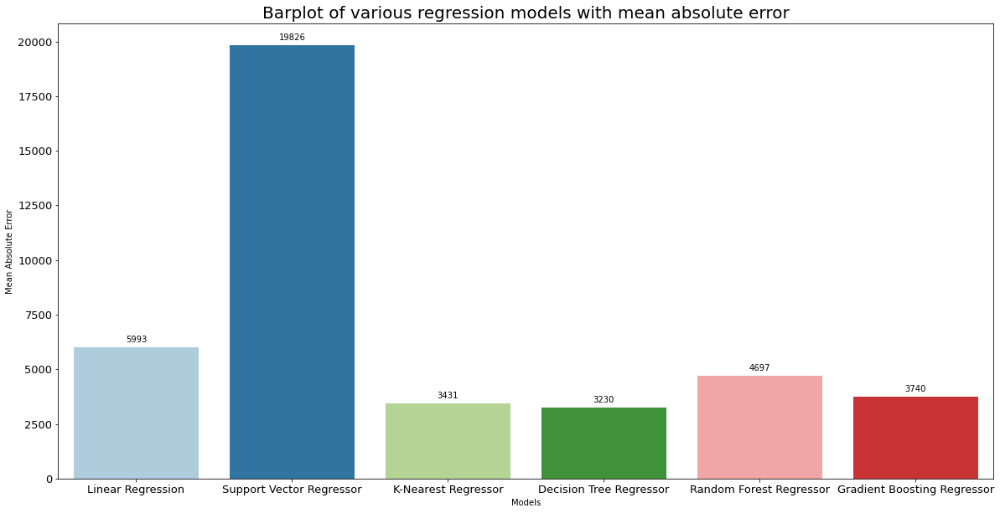

In [81]:
plt.figure(figsize = (20, 10))
splot = sns.barplot(data = model_dataframe, x = 'Models', y = 'Mean Absolute Error', palette = 'Paired')

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
    
plt.xticks(fontsize = 13)
plt.yticks(fontsize = 13)
plt.title("Barplot of various regression models with mean absolute error", fontsize = 20)
plt.show()

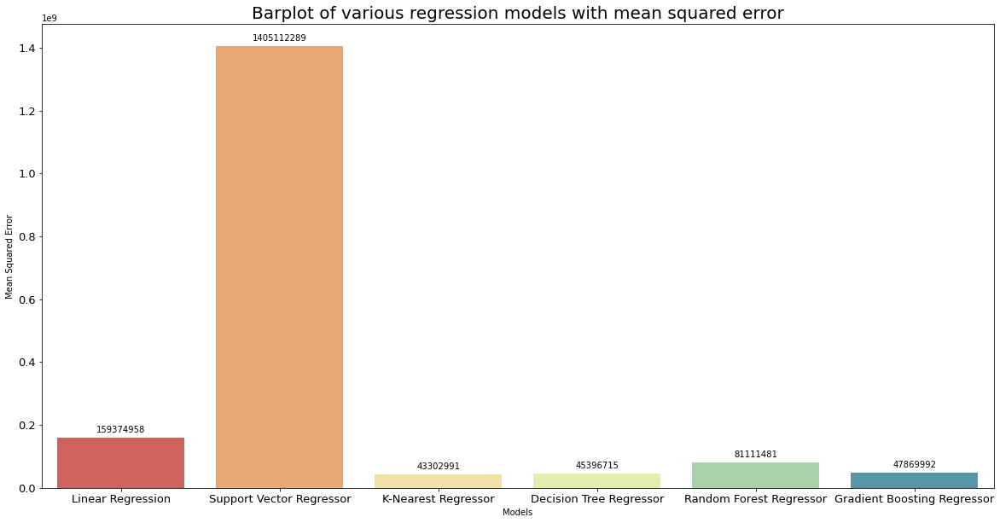

In [82]:
plt.figure(figsize = (20, 10))
splot = sns.barplot(data = model_dataframe, x = 'Models', y = 'Mean Squared Error', palette = 'Spectral')

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
    
plt.xticks(fontsize = 13)
plt.yticks(fontsize = 13)
plt.title("Barplot of various regression models with mean squared error", fontsize = 20)
plt.show()

### Conclusion

Mean Squared Error shows that K-Nearest Regressor is performing well. But we will use Mean Absolute Error as a metric for our deployment as it is more easily interpretable. In addition, note that Mean Squared Error is more sensitive to outliers as compared to Mean Absolute Error. Although we have incorporated outlier detection and removal, it would be safer to go with Mean Absolute Error as, in our case, it is more dependable than Mean Squared Error. Thus, we would use the Decision Tree Regressor for deploying in real-time to predict future prices of various cars based on the features.